In [1]:
import sys
import matplotlib.pyplot as plt
import numpy as np    

%matplotlib inline
import pandas as pd
from scipy.optimize import curve_fit
from scipy.stats import chisquare
import scipy.stats as stats
from itertools import combinations
import math
import os
import time
import seaborn as sns
sns.set()
from IPython import display
import imageio

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

#import cygno as cy
from cygno import s3, his, cmd
#import ROOT
#import root_numpy as rtnp

In [3]:
ls /media/cygno/hroot/WIN/


daq_rooted.log           Run_cosmics100ms.HIS    Run_cosmics500_2ms.root
Run_cosmics100_2ms.HIS   Run_cosmics100ms.root
Run_cosmics100_2ms.root  Run_cosmics500_2ms.HIS


0 0.0


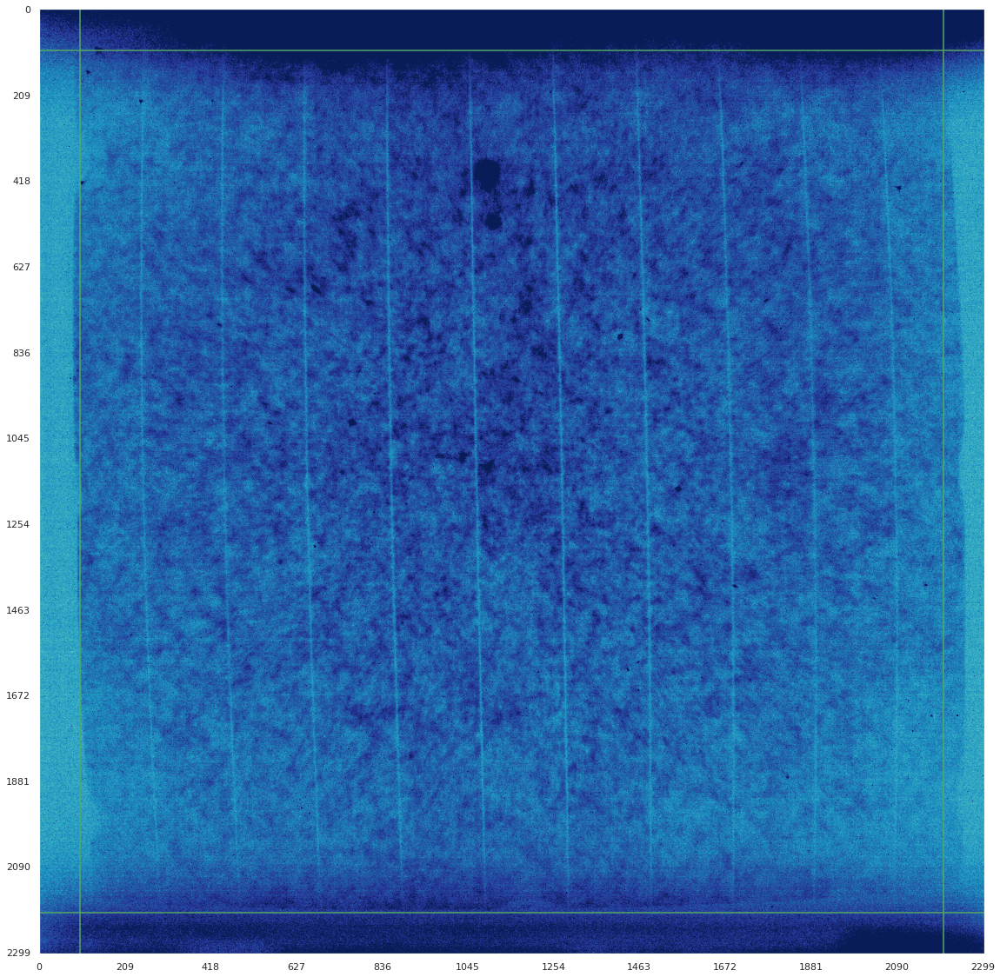

In [4]:
his_file = '/media/cygno/hroot/WIN/Run_cosmics500_2ms.HIS'

his = his.openHIS(his_file)
uno = True

# for idx, img in enumerate(his):   
#     if uno:
#         uno = False
#         imgt=img*0
#     if idx % 100 == 0: print(idx, np.mean(imgt))
#     imgt = img+imgt

for idx in range(0,100):   
    if uno:
        uno = False
        imgt=his[idx]*0
    if idx % 100 == 0: print(idx, np.mean(imgt))
    imgt = his[idx]+imgt

imgt=imgt/(idx+1)
fig = plt.figure(figsize=(20,20))
majorx_ticks = np.arange(0, np.size(imgt[0]),  int(np.size(imgt[0])/11))
majory_ticks = np.arange(0, np.size(imgt[0]),  int(np.size(imgt[0])/11))

#minor_ticks = np.arange(0, np.size(imgt[0]), 5)
plt.imshow(imgt, cmap='YlGnBu', vmin=95, vmax=105)

#plt.imshow(imgt, cmap='gray', vmin=95, vmax=105)
y0=100
plt.hlines(y0, 0, np.size(imgt[0])-1, colors='g')
plt.hlines(np.size(imgt[0])-y0, 0, np.size(imgt[0])-1, colors='g')
plt.vlines(y0, 0, np.size(imgt[0])-1, colors='g')
plt.vlines(np.size(imgt[0])-y0, 0, np.size(imgt[0])-1, colors='g')

plt.grid(color='r', linestyle='--', linewidth=1)
plt.xticks(majorx_ticks)
plt.yticks(majory_ticks)
plt.show()
plt.close()

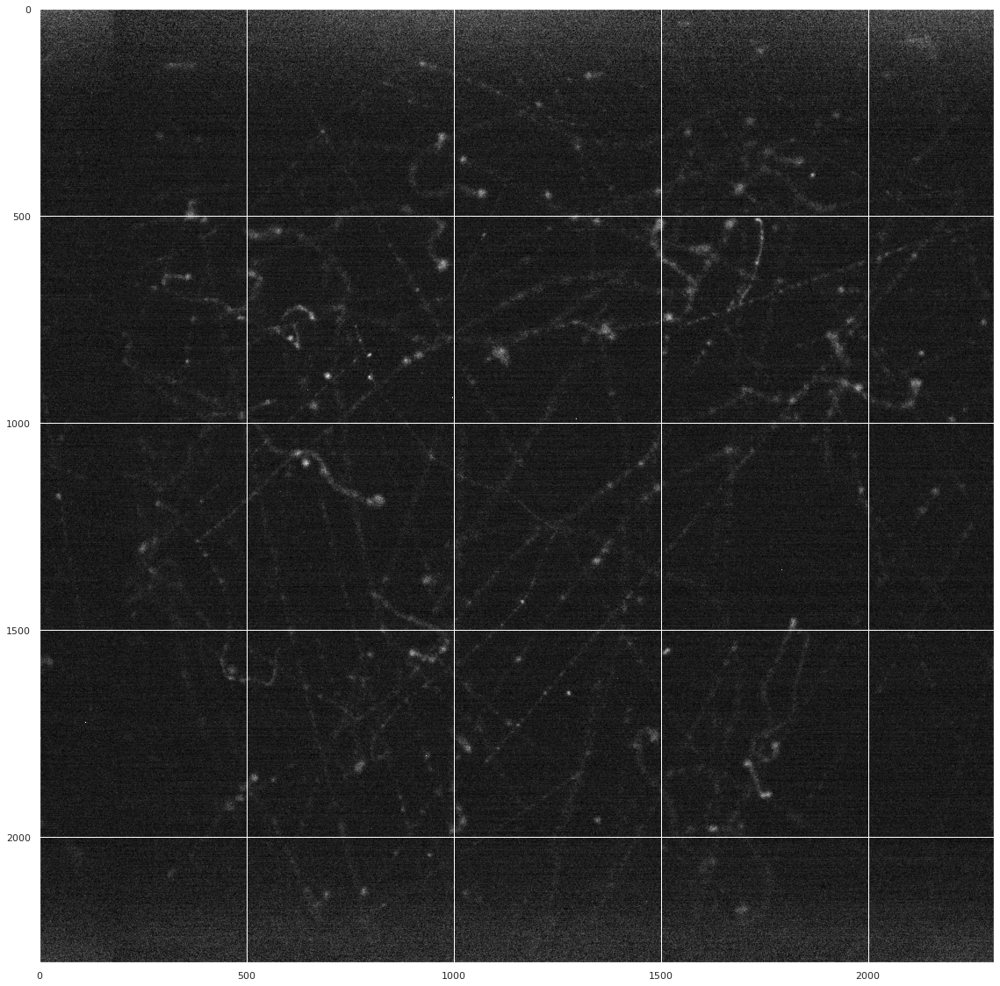

In [45]:
his_file = '/media/cygno/hroot/WIN/Run_cosmics500ms.HIS'
fig = plt.figure(figsize=(20,20))
his = cy.his.openHIS(his_file)
plt.imshow(his[1], cmap='gray', vmin=95, vmax=150)
plt.show()

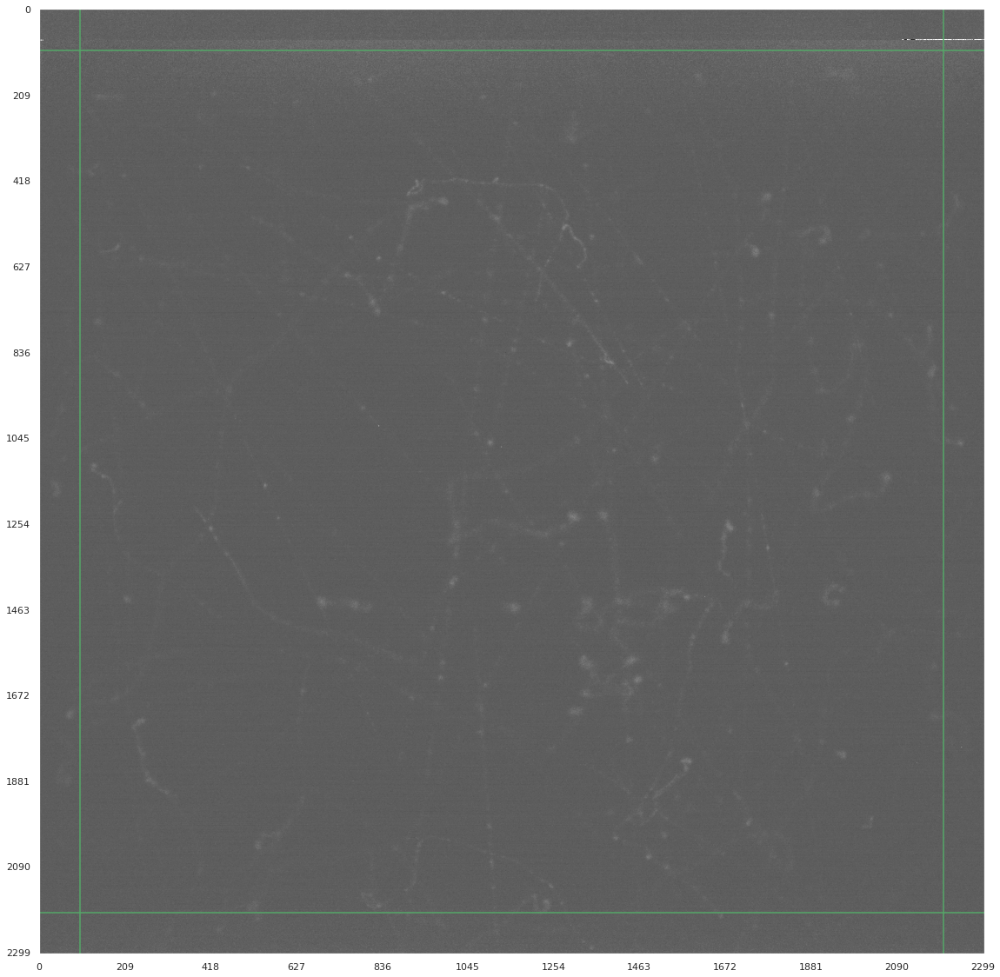

In [42]:
fig = plt.figure(figsize=(20,20))
majorx_ticks = np.arange(0, np.size(imgt[0]),  int(np.size(imgt[0])/11))
majory_ticks = np.arange(0, np.size(imgt[0]),  int(np.size(imgt[0])/11))

#minor_ticks = np.arange(0, np.size(imgt[0]), 5)
#plt.imshow(imgt, cmap='YlGnBu', vmin=95, vmax=150)

plt.imshow(imgt, cmap='gray', vmin=15, vmax=250)
y0=100
plt.hlines(y0, 0, np.size(imgt[0])-1, colors='g')
plt.hlines(np.size(imgt[0])-y0, 0, np.size(imgt[0])-1, colors='g')
plt.vlines(y0, 0, np.size(imgt[0])-1, colors='g')
plt.vlines(np.size(imgt[0])-y0, 0, np.size(imgt[0])-1, colors='g')

plt.grid(color='r', linestyle='--', linewidth=1)
plt.xticks(majorx_ticks)
plt.yticks(majory_ticks)
plt.show()

[]

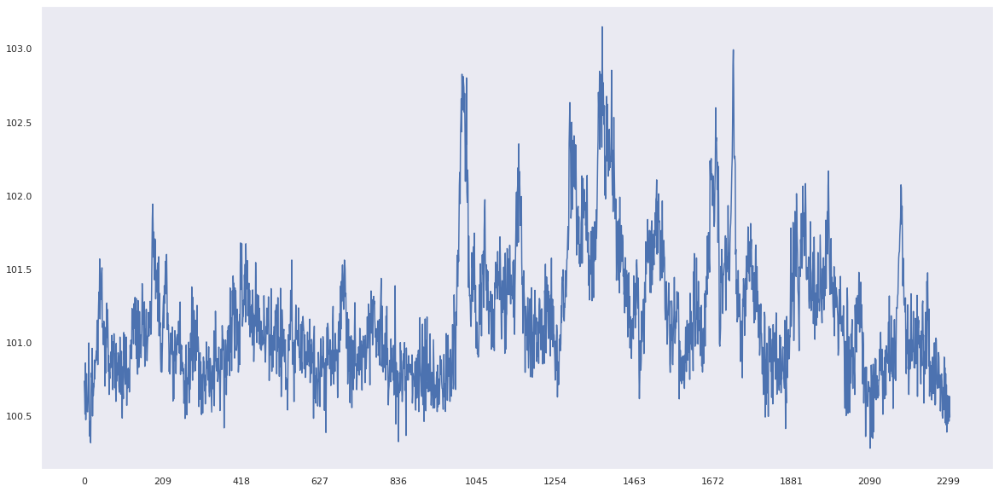

In [43]:
cuts = 800
y = np.mean(imgt[cuts:imgt.shape[0]-cuts,], axis=0)
x = np.arange(0, imgt.shape[0])
fig = plt.figure(figsize=(20,10))
#x = np.arange(0, 2300)
plt.plot(x, y, 'b', label='x')
plt.xticks(majorx_ticks)
plt.grid(color='r', linestyle='--', linewidth=1)
plt.plot()

[]

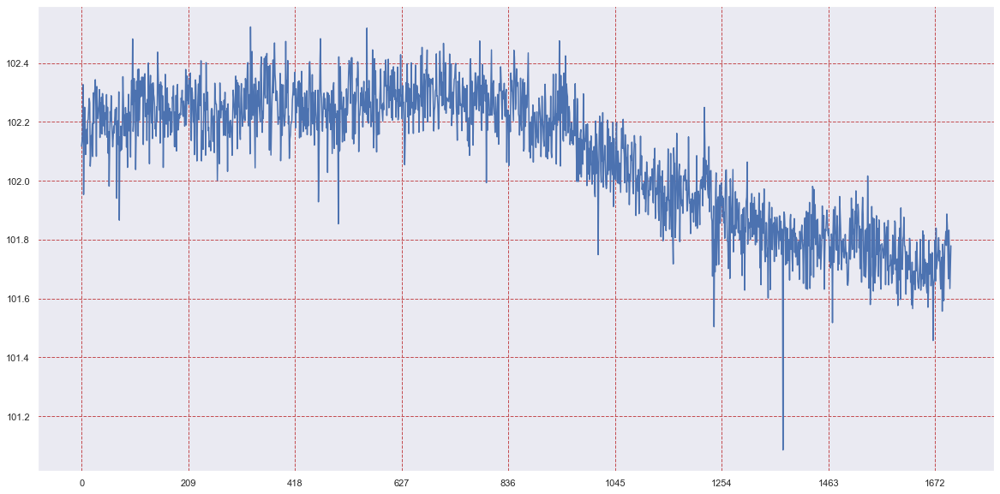

In [127]:
cuts = 300
y = np.mean(imgt[cuts:imgt.shape[0]-cuts,], axis=1)
x = np.arange(0, len(y))
fig = plt.figure(figsize=(20,10))
#x = np.arange(0, 2300)
plt.plot(x, y, 'b', label='x')
plt.xticks(majorx_ticks)
plt.grid(color='r', linestyle='--', linewidth=1)
plt.plot()

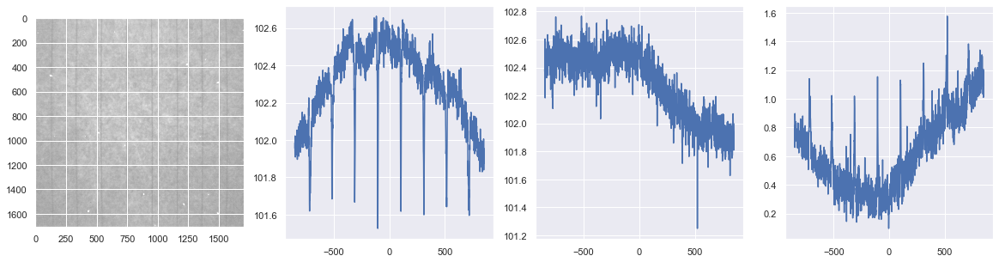

In [139]:
cuts = 300
x0 = (imgt.shape[1])/2
y0 = (imgt.shape[0])/2
ix  = np.mean(imgt[cuts:imgt.shape[0]-cuts,cuts:imgt.shape[0]-cuts], axis=0)
iy  = np.mean(imgt[cuts:imgt.shape[1]-cuts,cuts:imgt.shape[1]-cuts], axis=1)
ix0  = np.max(ix) #ix[int(x0)]
iy0  = np.max(iy) #iy[int(y0)]
I = np.sqrt((ix-ix0)**2 + (iy-iy0)**2)
r = np.linspace(-len(I)/2, len(I)/2, len(I))
fig, ax = plt.subplots (1,4, figsize=(20,5))

ax[0].imshow(imgt[cuts:imgt.shape[0]-cuts,cuts:imgt.shape[0]-cuts], cmap='gray', vmin=95, vmax=105)
ax[1].plot(r,ix)
ax[2].plot(r,iy)
ax[3].plot(r, I)
plt.show()

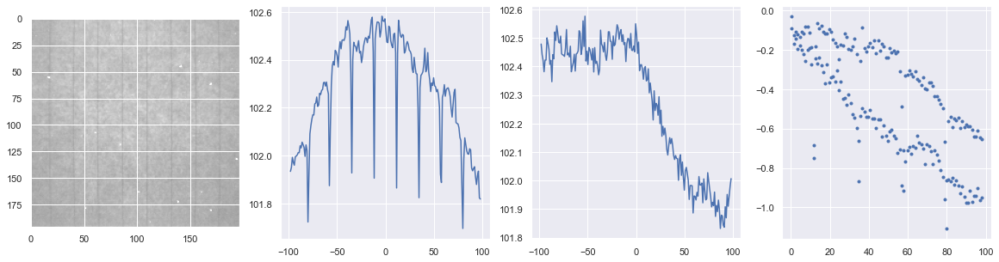

In [150]:
cuts = 30
rescale = 256
imgb = cy.rebin(imgt, (rescale, rescale))
x0 = (imgb.shape[1])/2
y0 = (imgb.shape[0])/2
# [cuts:imgt.shape[0]-cuts,]
ix  = np.mean(imgb[cuts:imgb.shape[0]-cuts,cuts:imgb.shape[0]-cuts], axis=0)
iy  = np.mean(imgb[cuts:imgb.shape[1]-cuts,cuts:imgb.shape[1]-cuts], axis=1)
ix0  = np.max(ix) #ix[int(x0)]
iy0  = np.max(iy) #iy[int(y0)]
I = np.sqrt((ix-ix0)**2 + (iy-iy0)**2)
r = np.linspace(-len(I)/2, len(I)/2, len(I))
fig, ax = plt.subplots (1,4, figsize=(20,5))

ax[0].imshow(imgb[cuts:imgb.shape[0]-cuts,cuts:imgb.shape[0]-cuts], cmap='gray', vmin=95, vmax=105)
ax[1].plot(r,ix)
ax[2].plot(r,iy)
ax[3].plot(abs(r), -I, 'b.')
plt.show()

[-4.09748705e-01  6.44155570e+02  2.02369045e+00  1.06961104e+02]
[-5.06019111e-01  1.25008413e+03  2.56205560e+00  1.05769562e+02]
[-4.54178982e-01  1.65115090e+03  9.84037900e+00  1.05545154e+02]


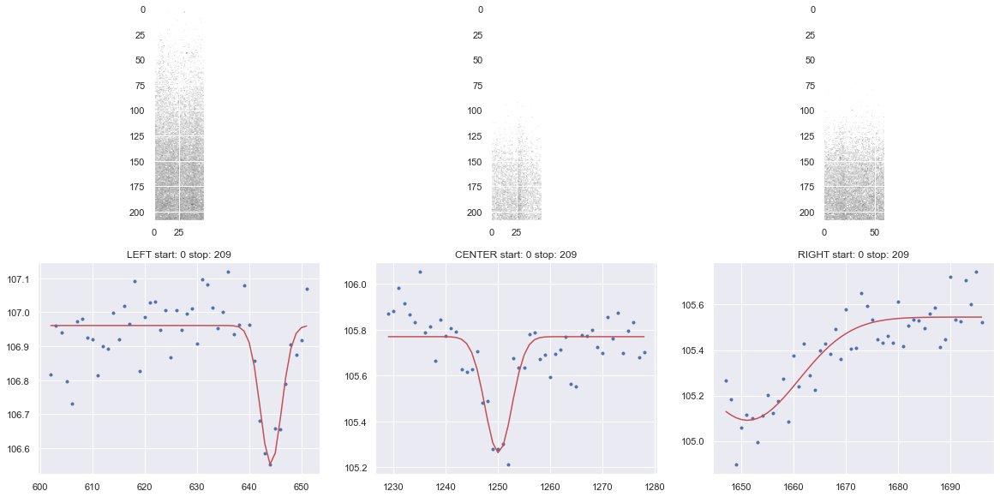

[ -0.72130584 640.20270189   2.87766828 102.63222562]
[-1.07896284e+00  1.25123086e+03  1.93867259e+00  1.02725489e+02]
[-6.64336928e-01  1.65787970e+03  4.79559038e+00  1.02514264e+02]


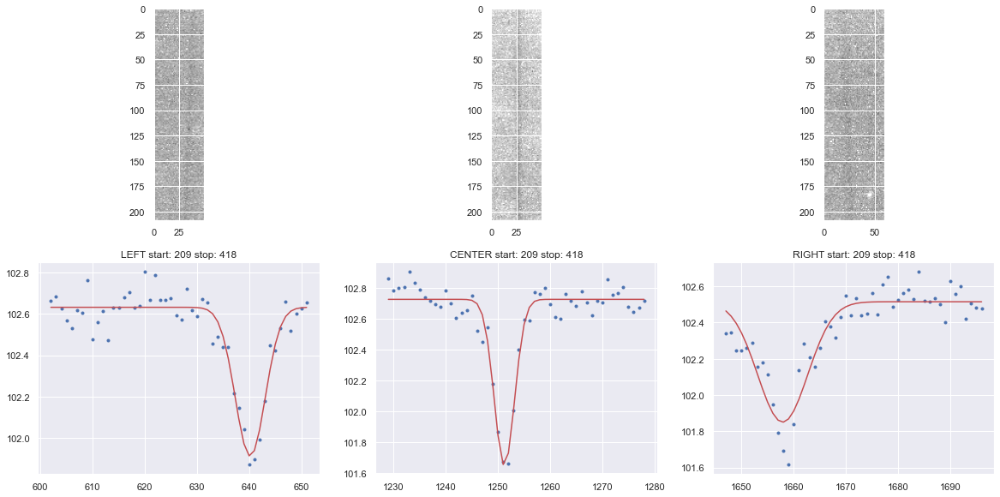

[ -0.77363609 636.89987162   3.02430778 102.5135331 ]
[  -1.3938007  1252.0713547     2.06211344  102.80005086]
[-6.98070595e-01  1.66126265e+03  3.98087098e+00  1.02370817e+02]


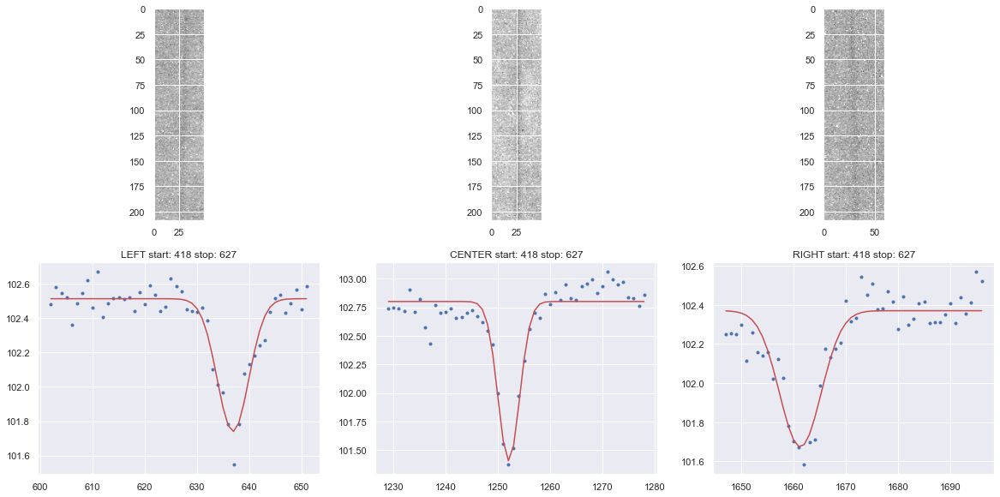

[ -0.91034965 635.09586161   4.27542145 102.63942516]
[-1.11220028e+00  1.25357708e+03  2.43057118e+00  1.02608484e+02]
[-8.81392380e-01  1.66435844e+03  5.52675783e+00  1.02544962e+02]


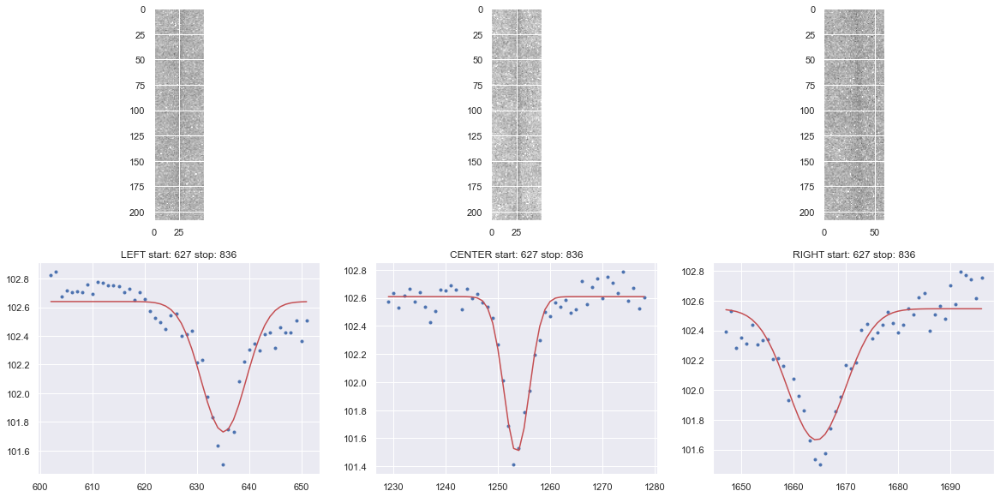

[ -0.96437243 633.83400997   2.45529972 102.5015746 ]
[-1.11354816e+00  1.25429050e+03  2.45500381e+00  1.02686013e+02]
[-8.59949412e-01  1.66653128e+03  3.47031984e+00  1.02413618e+02]


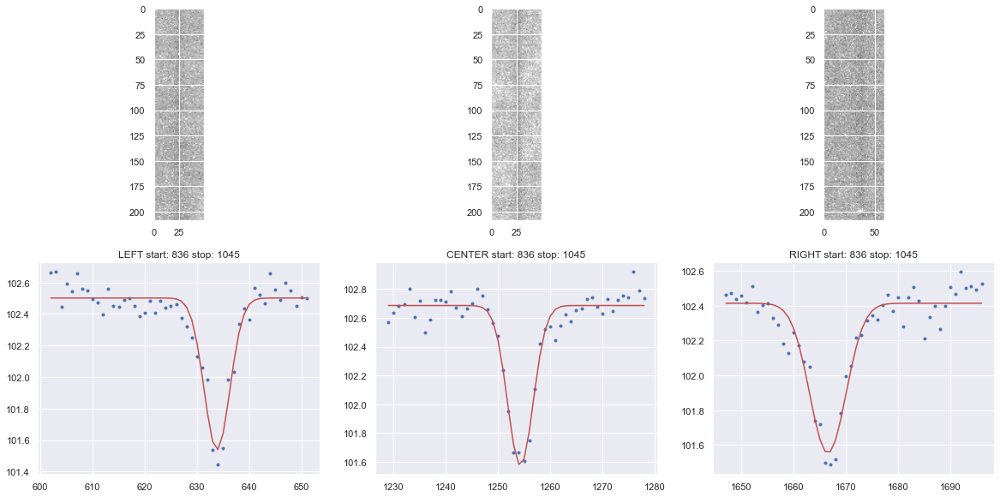

[ -0.84136162 633.64639915   2.4139651  102.33192985]
[-1.15340277e+00  1.25499533e+03  2.65491121e+00  1.02637078e+02]
[-9.79138015e-01  1.66749476e+03  2.65305297e+00  1.02524682e+02]


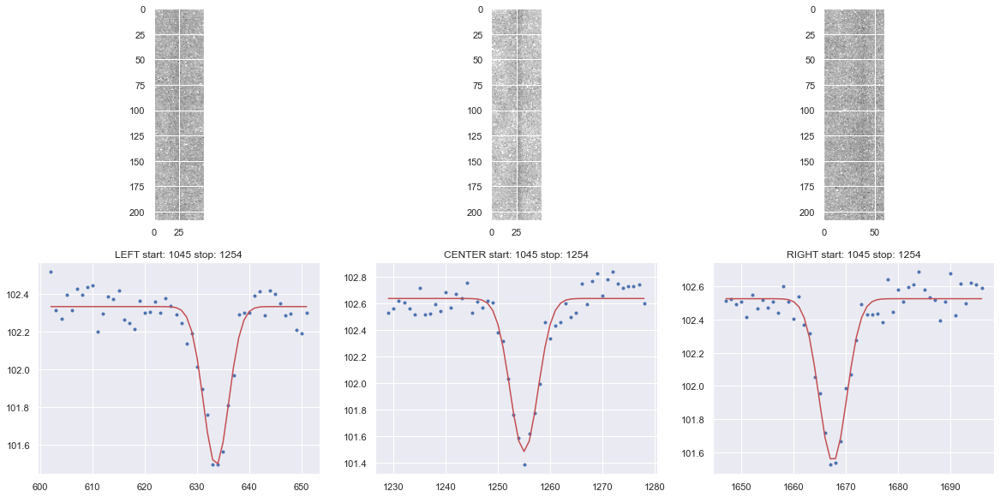

[ -0.72009179 634.92216334   2.49771244 102.16082655]
[-9.84569156e-01  1.25563688e+03  2.79986547e+00  1.02477905e+02]
[-7.49116807e-01  1.66781938e+03  2.79708754e+00  1.02175779e+02]


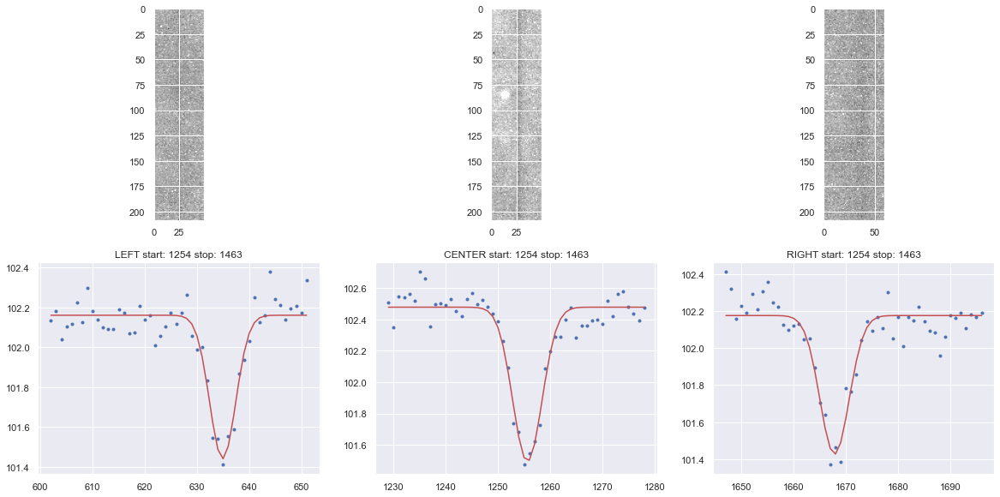

[-5.96685764e-01  6.37047606e+02  3.10561495e+00  1.02042257e+02]
[-9.10348665e-01  1.25566568e+03  3.61446279e+00  1.02307952e+02]
[-6.58101818e-01  1.66628038e+03  2.74618201e+00  1.01948164e+02]


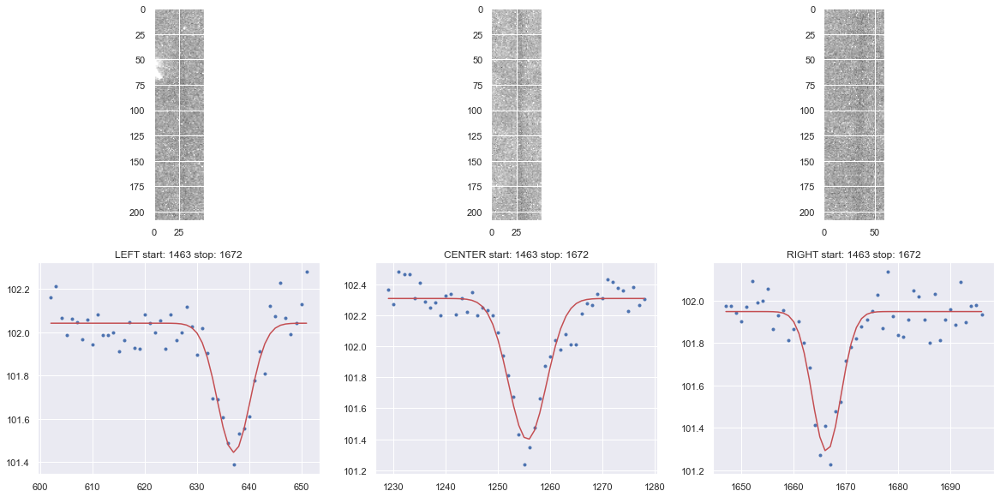

[-4.21830660e-01  6.40842181e+02  4.33122039e+00  1.01901852e+02]
[-9.70329949e-01  1.25518773e+03  2.80690875e+00  1.02177634e+02]
[-7.14093058e-01  1.66404036e+03  3.41966527e+00  1.02002929e+02]


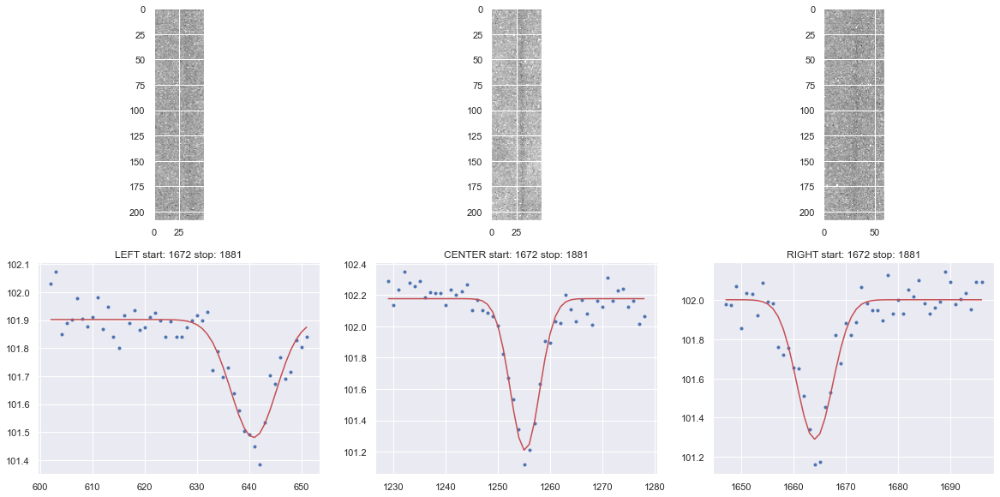

[-5.11000120e-01  6.45597696e+02  3.26283380e+00  1.02027833e+02]
[-6.68583884e-01  1.25551281e+03  3.45132281e+00  1.02275573e+02]
[-5.99800086e-01  1.66089158e+03  2.68857549e+00  1.01924182e+02]


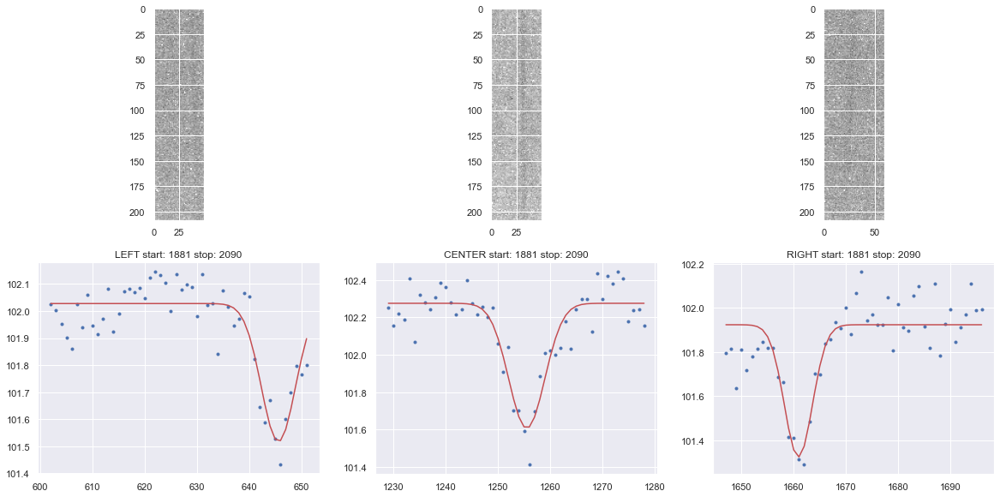

[-3.07963120e-01  6.48962172e+02  1.76107919e+00  1.03850458e+02]
[-3.60427095e-01  1.25462937e+03  2.52396501e+00  1.03954617e+02]
[-1.17806667e-01  1.65953823e+03  4.63620762e+00  1.03614798e+02]


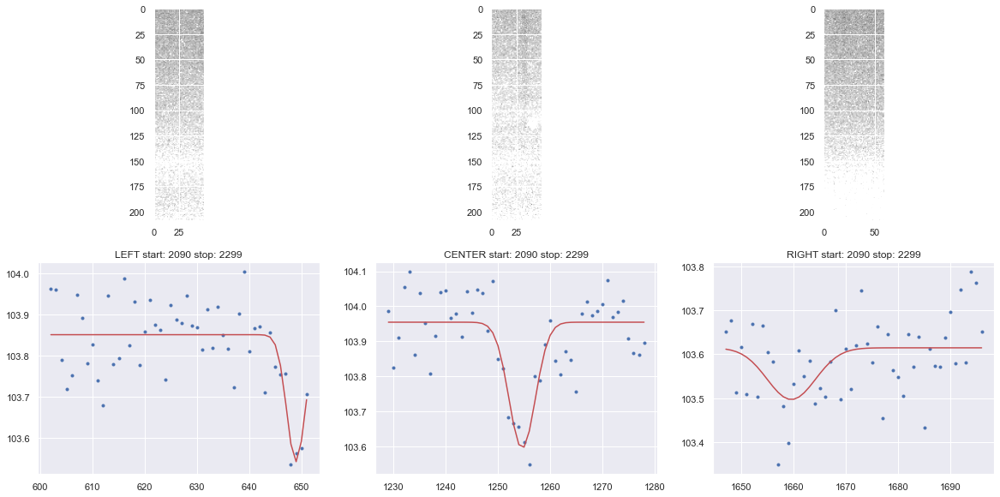

In [7]:

columns = ["slice", "x0", "x0_fit", "sigma_fit"]
df = pd.DataFrame(columns = columns)

vmin = 95
vmax = 105
grana = 11
for i in range(0, grana):
    fig, ax = plt.subplots (2,3, figsize=(20,10))
   
    starty = int(len(x)/grana)*i
    dy = int(len(x)/grana)
    imc = imgt[starty:starty+dy,]
    ax[0,0].imshow(imc[:,210:260], cmap='gray', vmin=vmin, vmax=vmax)
    ax[0,1].imshow(imc[:,1020:1070], cmap='gray', vmin=vmin, vmax=vmax)
    ax[0,2].imshow(imc[:,2030:2090], cmap='gray', vmin=vmin, vmax=vmax)
    y = np.mean(imc, axis=0)
    x = np.arange(0, imgt.shape[0])
    
    dx0=25
    x0 = 627
    xs = x0-dx0
    xe = x0+dx0
    ax[1, 0].set_title('LEFT start: '+str(starty)+' stop: '+str(starty+dy))
    ax[1, 0].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
    try:
        p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))

        popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
        ax[1, 0].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
        print (popt)       
        df  = df.append({columns[0]:i, columns[1]:x0, columns[2]:popt[1], columns[3]:popt[2]},
                ignore_index=True)
    except:
        print ("fit error...")
    
    dx0=25
    x0 = 1254
    xs = x0-dx0
    xe = x0+dx0

    ax[1, 1].set_title('CENTER start: '+str(starty)+' stop: '+str(starty+dy))
    ax[1, 1].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
    try:
        p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))
        popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
        ax[1, 1].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
        print (popt) 
        df  = df.append({columns[0]:i, columns[1]:x0, columns[2]:popt[1], columns[3]:popt[2]},
                ignore_index=True)
    except:
        print ("fit error...")
    
   
    
    dx0=25
    x0 = 1672
    xs = x0-dx0
    xe = x0+dx0
    
    ax[1, 2].set_title('RIGHT start: '+str(starty)+' stop: '+str(starty+dy))
    ax[1, 2].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
    try:
        p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))
        popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
        ax[1, 2].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
        print (popt) 
        df  = df.append({columns[0]:i, columns[1]:x0, columns[2]:popt[1], columns[3]:popt[2]},
                ignore_index=True)
    except:
        print ("fit error...")
    plt.show()
    

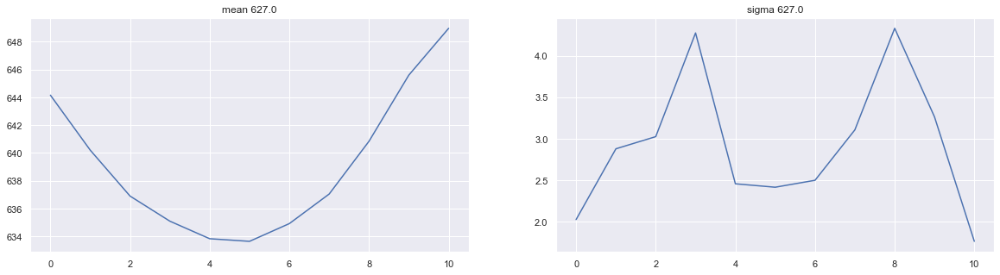

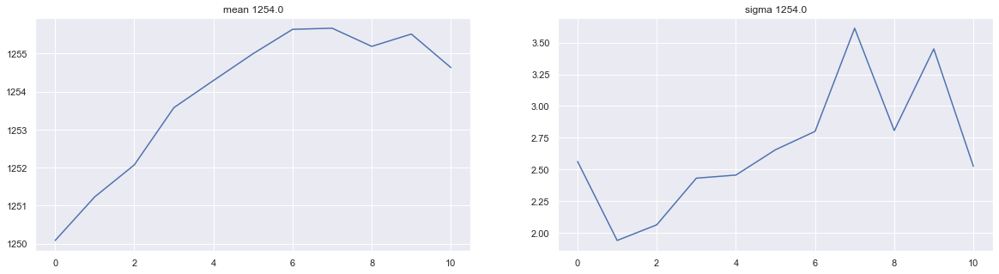

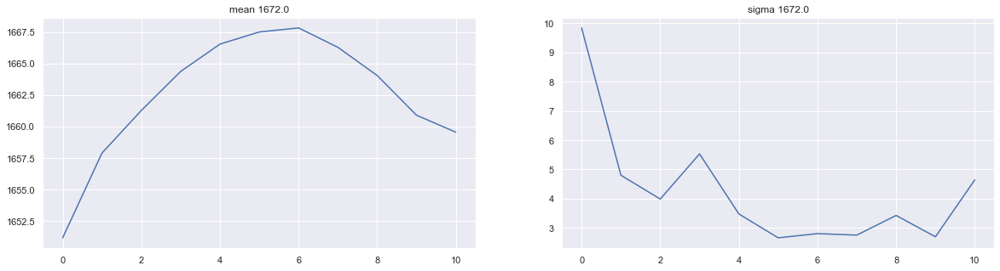

In [8]:
x0 = np.array([627.0, 1254.0, 1672.0])
for i in range(len(x0)):
    fig, ax = plt.subplots (1,2, figsize=(20,5))

    ax[0].set_title("mean "+str(x0[i]))
    ax[0].plot(df[df.x0==x0[i]].slice, df[df.x0==x0[i]].x0_fit)
    ax[1].set_title("sigma "+str(x0[i]))
    ax[1].plot(df[df.x0==x0[i]].slice, df[df.x0==x0[i]].sigma_fit)
    plt.show()

In [9]:
grana = 22
elucefu=np.zeros(shape=(grana,grana))
for i in range(0, grana):
    xs = int(imgt.shape[0]/grana)*i
    dx = int(imgt.shape[0]/grana)
    xe = xs + dx
    for j in range(0, grana):
        ys = int(imgt.shape[0]/grana)*j
        dy = int(imgt.shape[0]/grana)
        ye = ys + dy
#        plt.imshow(imgt[ys:ye, xs:xe], cmap='gray', vmin=vmin, vmax=vmax)
#        plt.show()
        elucefu[i,j] = imgt[ys:ye, xs:xe].mean()
        

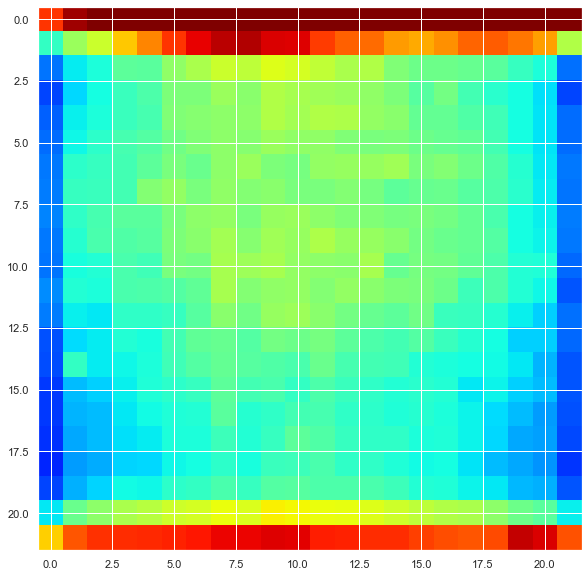

In [10]:
from mpl_toolkits import mplot3d
psize = int(elucefu.T.shape[0]/2)
fig, ax = plt.subplots (1, figsize=(10,10))
#ax.scatte3Dr(elucefu.T, cmap='YlGnBu_r', vmin=vmin, vmax=vmax)
#plt.plot(psize,psize, '.')
ax.imshow(elucefu.T, cmap='jet', vmin=100, vmax=105)

ax.grid('off')
plt.show()

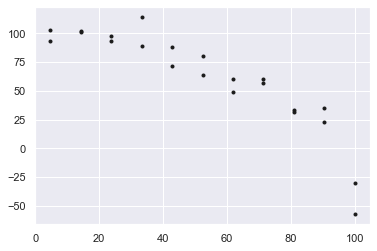

In [11]:
pzero = int(grana/11)
yvar = 100-100*(elucefu.T[psize][psize-pzero: psize+pzero].mean()-elucefu.T[psize])
xvar = np.linspace(-100,100, len(yvar))
plt.plot(abs(xvar), yvar, 'k.')
#plt.ylim(-100, 10)
plt.show()

In [12]:
elucefu.T[psize][pzero-pzero: psize+pzero].mean()

102.30594283397815

In [13]:
lumi0 = pd.DataFrame([
[15.177996966564596, 93.87999574932617],
[24.28496903770542, 90.20770338025176],
[30.62011534783071, 87.71613227324104],
[36.163766869861774, 85.35468974911363],
[44.6116912851526, 81.5490807917846],
[53.32508960227217, 76.95284650237167],
[61.38088935689238, 71.56395815018404],
[69.30598089128901, 65.64730999971019],
[74.3253504390753, 61.83416575695807],
[81.45952682271792, 55.783911199559476],
[86.34702887560016, 51.97047713813724],
[91.2356902031629, 47.62957309709892],
[96.25592920695951, 43.42082636963474]], columns=['r', 'e'])

lumi1 = pd.DataFrame([
[3.1682010955145827, 98.3371170770821 ],
[10.163554336170346, 95.45139257870991],
[17.9509820022606, 92.17180450764639],
[24.683759527788784, 88.75803039231786],
[34.981596514447475, 83.24220146261823],
[45.81038130476365, 76.14512186875078],
[53.73518302049018, 70.36034121318096],
[61.39624974640867, 64.57498092027089],
[68.79358148251912, 58.78904099002058],
[76.58738515935198, 52.608368031068565],
[83.98558635147275, 46.42682561610619],
[91.12005255378551, 40.24470356380357],
[98.51883338324656, 33.799426159033175]], columns=['r', 'e'])

lumi2 = pd.DataFrame([
[8.315670495493325,  96.23854008675238],
[15.70749567687152, 92.95808255967849],
[24.41973471931063, 88.88931824988165],
[32.60595287548425, 84.16005719088423],
[41.32166974196478, 78.50888294223914],
[51.623564190005126, 71.14690908388319],
[58.88873861254143, 65.49254682986678],
[65.62557359945127, 60.23262778588197],
[70.7773902794818, 56.156038371991926],
[75.92949677818244, 51.947581463197864],
[82.00670447190208, 46.818080820766475],
[88.48067392501426, 41.16197965472935],
[93.36875561523672, 37.08481060349909],
[97.72849786983276, 33.40208476230039 ]], columns=['r', 'e'])


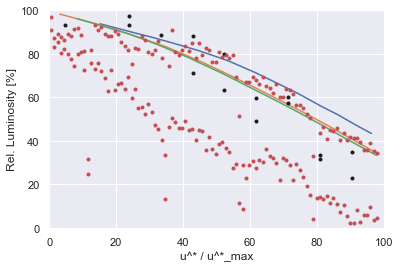

In [154]:
plt.plot(lumi0.r, lumi0.e)
plt.plot(lumi1.r, lumi1.e)
plt.plot(lumi2.r, lumi2.e)
#plt.plot(100*abs(c0-dd.x0)/c0, -abs(100*(dd.x0-(dd.c-dd.b**2/(4*dd.a)))/c0), 'k.')
plt.plot(abs(xvar), yvar, 'k.')
plt.xlabel(r'u^* / u^*_max')
plt.ylabel(r'Rel. Luminosity [%]')
plt.xlim(0,100)
plt.ylim(0,100)
plt.plot(abs(r), 100-I*100, 'r.')
plt.show()

fit error...


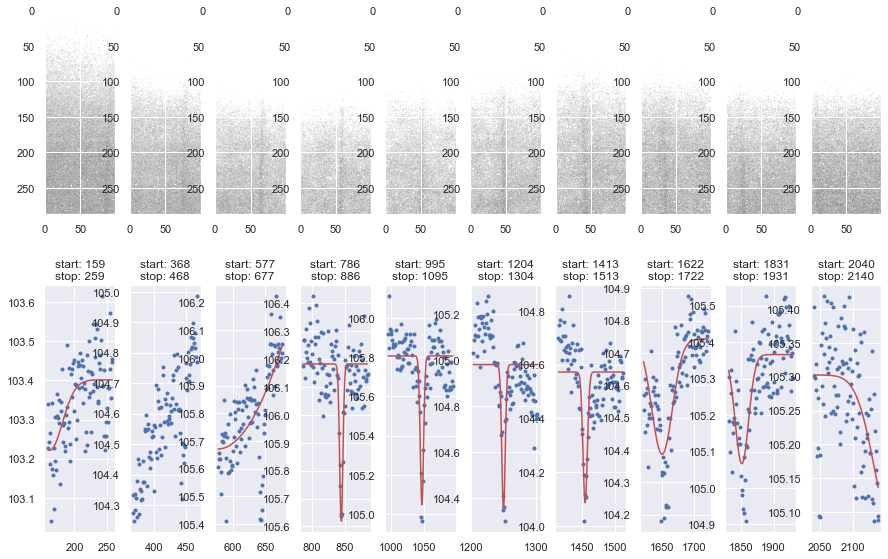

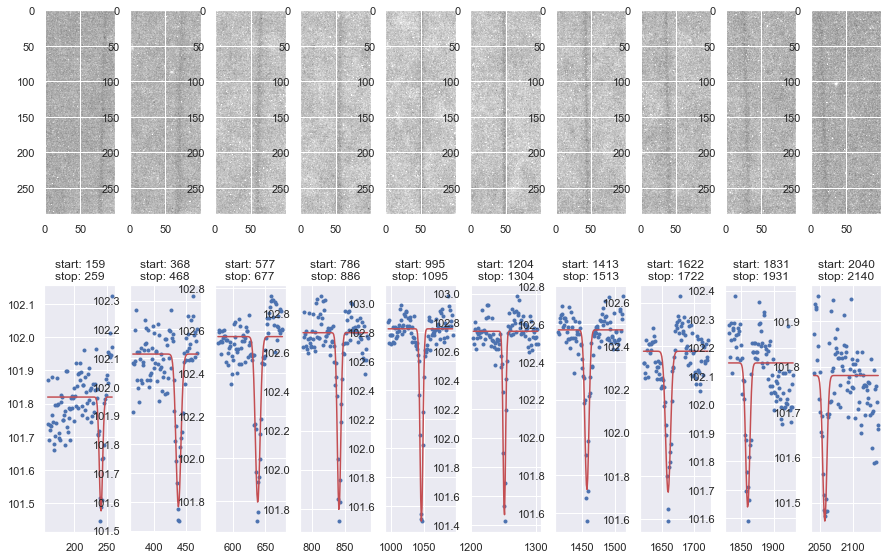

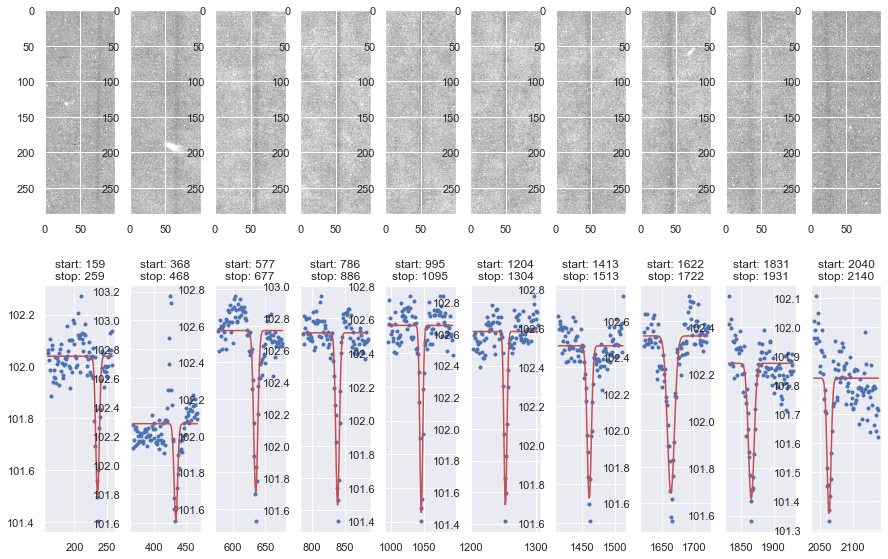

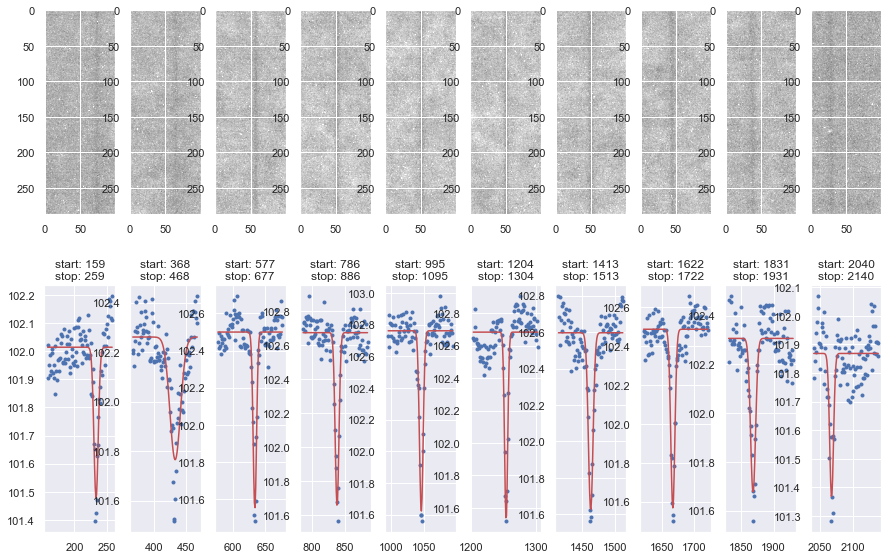

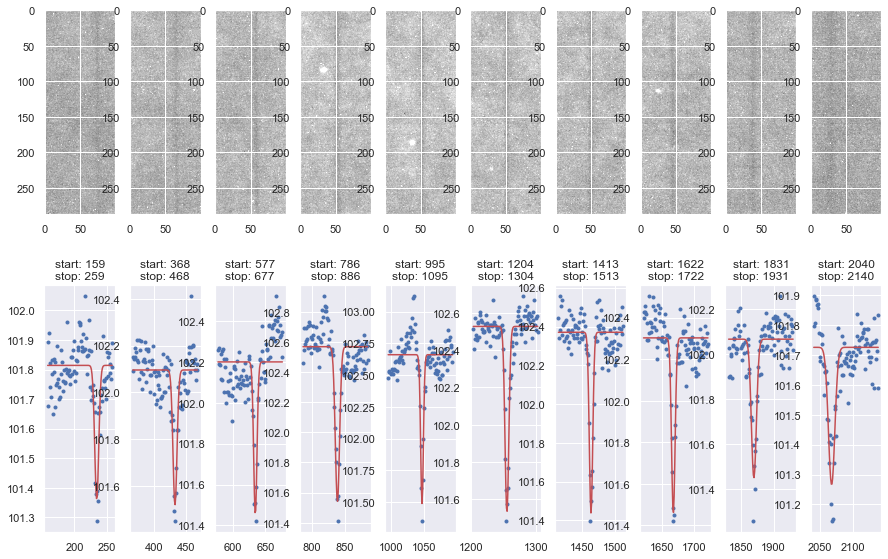

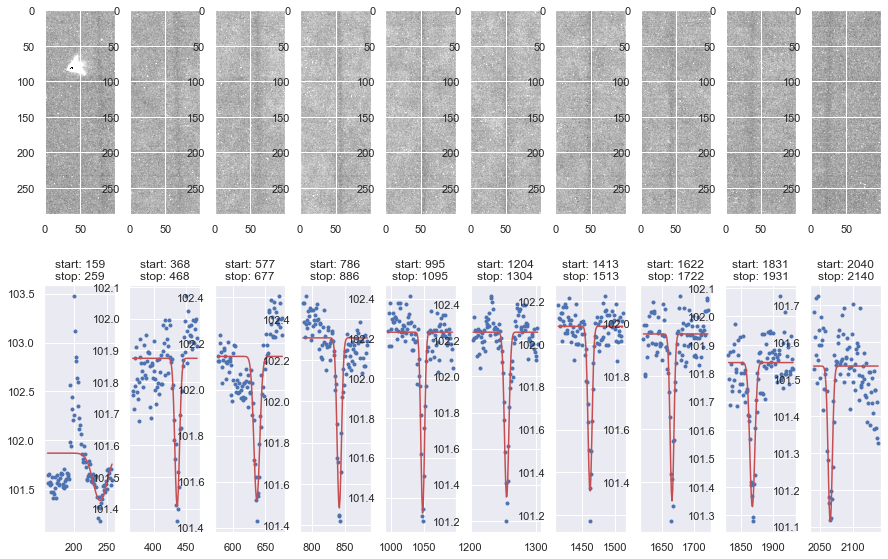

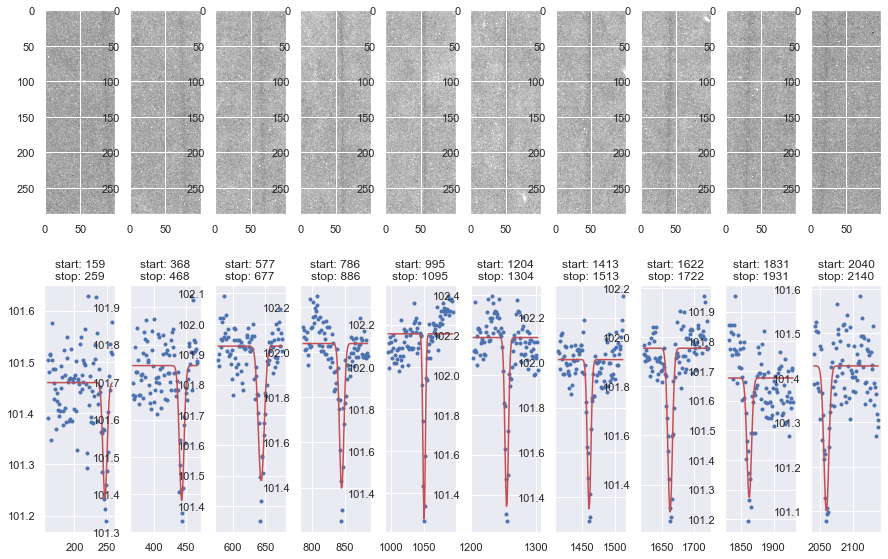

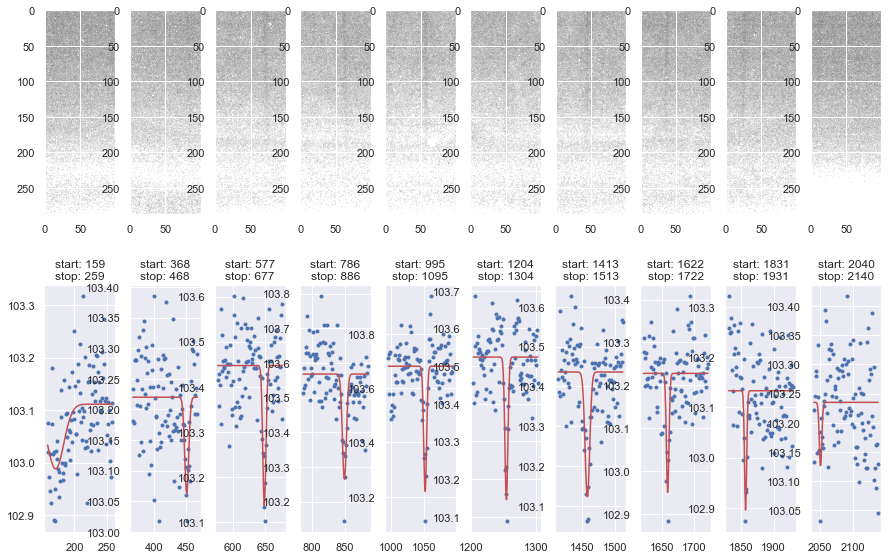

In [15]:
columns = ["slice", "x0", "x0_fit", "sigma_fit"]
df = pd.DataFrame(columns = columns)

vmin = 95
vmax = 105
granax = 10
granay = 8
centri = majorx_ticks[1:-1]
x = np.arange(0, imgt.shape[0])

for j in range(granay):
    fig, ax = plt.subplots (2,granax, figsize=(15,10))
    ys = int(imgt.shape[0]/granay)*j
    dy = int(imgt.shape[0]/granay)
    ye = ys + dy
    
    for i in range(granax):
        xc = centri[i]
        dx0 = 50
        xs = xc - dx0
        xe = xc + dx0
        y = np.mean(imgt[ys:ye,:], axis=0)

        ax[0, i].imshow(imgt[ys:ye, xs:xe], cmap='gray', vmin=vmin, vmax=vmax) 
        ax[1, i].set_title('start: '+str(xs)+'\nstop: '+str(xe))
        ax[1, i].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
        try:
            p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))
            popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
            ax[1, i].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
            if (popt[2]<10.):
                df  = df.append({columns[0]:j, columns[1]:xc, columns[2]:popt[1], columns[3]:popt[2]},
                ignore_index=True)
        except:
            print ("fit error...")

        
    plt.show()


    #plt.show()

[  1.67340422 -10.50362751 249.70112485]
[  1.24727943  -7.86159419 444.79891766]
[  0.98472423  -6.07161097 643.16943974]
[ 7.04529972e-01 -4.17809303e+00  8.44635977e+02]
[ 2.38082823e-01 -9.12521712e-01  1.04677989e+03]
[-1.95931570e-01  2.04544325e+00  1.25017264e+03]
[-5.74660512e-01  4.56475808e+00  1.45363872e+03]
[-9.01587819e-01  7.02010520e+00  1.65373212e+03]
[-1.19656796e+00  8.96292216e+00  1.85259085e+03]
[-1.56587275e+00  1.14701041e+01  2.04696043e+03]


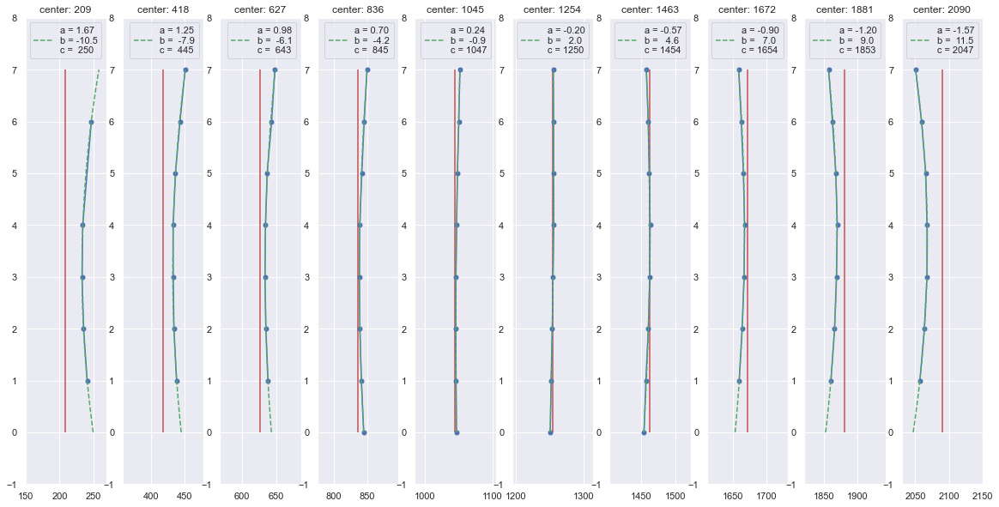

In [35]:
x0 = np.array(majorx_ticks[1:-1])
fig, ax = plt.subplots (1,len(x0), figsize=(20,10))
columns = ['x0', 'a', 'b', 'c']
c0 = imgt.shape[0]/2
dd = pd.DataFrame(columns = columns)
poly_degree = 2
for i in range(len(x0)):
    ax[i].set_title("center: "+str(x0[i]))
    ax[i].plot( df[df.x0==x0[i]].x0_fit, df[df.x0==x0[i]].slice, 'b.-', markersize=10)
    coeffs = np.polyfit(df[df.x0==x0[i]].slice,df[df.x0==x0[i]].x0_fit,  poly_degree)
    print (coeffs)
    #x = df[df.x0==x0[i]].slice
    x = np.linspace(0, 7, 30)
    y = coeffs[0]*x**2+coeffs[1]*x+coeffs[2]
    ax[i].plot(y,x, 'g--', label="a = {:3.2f}\nb = {:5.1f}\nc = {:4.0f}".format(coeffs[0], coeffs[1], coeffs[2]))    
    ax[i].set_ylim(-1,8)
    ax[i].set_xlim(x0[i]-60, x0[i]+60)
    ax[i].legend()
    dd  = dd.append({columns[0]:x0[i], columns[1]:coeffs[0], columns[2]:coeffs[1], columns[3]:coeffs[2]},
                ignore_index=True)
    # ax[i].vlines(dd.c-dd.b**2/(4*dd.a), 0, 7, 'g')
    ax[i].vlines(dd.x0, 0, 7, 'r')
plt.show()

In [17]:
dd

,x0,a,b,c
0,209.0,1.673404,-10.503628,249.701125
1,418.0,1.247279,-7.861594,444.798918
2,627.0,0.984724,-6.071611,643.169440
3,836.0,0.704530,-4.178093,844.635977
4,1045.0,0.238083,-0.912522,1046.779893
5,1254.0,-0.195932,2.045443,1250.172644
6,1463.0,-0.574661,4.564758,1453.638720
7,1672.0,-0.901588,7.020105,1653.732121
8,1881.0,-1.196568,8.962922,1852.590848
9,2090.0,-1.565873,11.470104,2046.960435


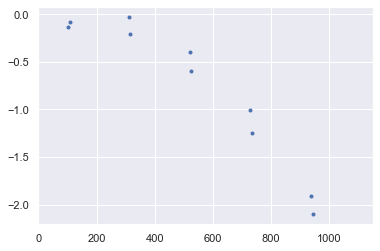

In [18]:
# http://www.ce.unipr.it/~medici/geometry/node135.html
c0 = imgt.shape[0]/2
#plt.plot(abs(c0-dd.x0), 1/abs(dd.a), 'b.')

#plt.show()
plt.plot(abs(c0-dd.x0), -abs(100*(dd.x0-(dd.c-dd.b**2/(4*dd.a)))/c0), 'b.')
plt.xlim(0, c0)
plt.show()

In [19]:
100*(dd.x0-(dd.c-dd.b**2/(4*dd.a)))/c0

0   -2.102329
1   -1.250957
2   -0.591177
3   -0.211946
4   -0.078604
5   -0.131166
6    0.025725
7    0.399529
8    1.009106
9    1.912741
dtype: float64

[-1.56587275e+00  1.14701041e+01  2.04696043e+03]
13    1.0
23    2.0
33    3.0
43    4.0
52    5.0
62    6.0
71    7.0
Name: slice, dtype: float64 13    2056.864666
23    2063.637152
33    2067.277892
43    2067.786887
52    2065.164136
62    2059.409640
71    2050.523398
Name: slice, dtype: float64


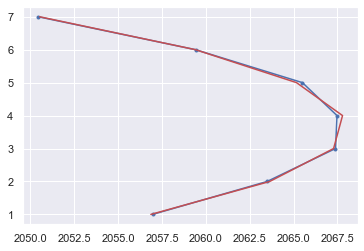

In [20]:
poly_degree = 2
plt.plot( df[df.x0==x0[i]].x0_fit, df[df.x0==x0[i]].slice, 'b.-')
coeffs = np.polyfit(df[df.x0==x0[i]].slice,df[df.x0==x0[i]].x0_fit,  poly_degree)
print (coeffs)
x = df[df.x0==x0[i]].slice
y = coeffs[0]*x**2+coeffs[1]*x+coeffs[2]
print (x,y)
plt.plot(y,x, 'r-')
plt.show()

In [21]:
lens2 = pd.DataFrame([[20.127118644067792, -0.20317460317460334],
[26.101694915254228, -0.33015873015873076],
[32.33050847457627, -0.49523809523809526],
[38.177966101694906, -0.7111111111111112],
[44.27966101694915, -0.9396825396825399],
[52.92372881355931, -1.3460317460317457],
[58.77118644067795, -1.6634920634920638],
[64.4915254237288, -1.980952380952381],
[69.95762711864407, -2.311111111111112],
[75.16949152542372, -2.7174603174603167],
[82.66949152542372, -3.25079365079365],
[87.62711864406779, -3.6571428571428584],
[92.45762711864406, -4.088888888888889],
[97.28813559322033, -4.520634920634921]], columns=['r', 'e'])

lens1 = pd.DataFrame([[31.44067796610169, -0.33015873015873076],
[40.593220338983045, -0.5333333333333332],
[49.999999999999986, -0.8126984126984125],
[58.26271186440677, -1.0920634920634926],
[67.54237288135592, -1.4349206349206352],
[77.45762711864406, -1.8666666666666663],
[84.57627118644066, -2.234920634920635],
[93.34745762711863, -2.692063492063493 ]], columns=['r', 'e'])

lens0 = pd.DataFrame([[32.83898305084745, -0.30476190476190457],
[41.61016949152541, -0.4825396825396826],
[50.889830508474574, -0.723809523809523],
[61.44067796610169, -1.0539682539682538],
[69.83050847457626, -1.3460317460317457],
[82.03389830508473, -1.8285714285714292],
[89.02542372881355, -2.120634920634921],
[95.63559322033898, -2.412698412698413]], columns=['r', 'e'])




In [22]:
dd

,x0,a,b,c
0,209.0,1.673404,-10.503628,249.701125
1,418.0,1.247279,-7.861594,444.798918
2,627.0,0.984724,-6.071611,643.169440
3,836.0,0.704530,-4.178093,844.635977
4,1045.0,0.238083,-0.912522,1046.779893
5,1254.0,-0.195932,2.045443,1250.172644
6,1463.0,-0.574661,4.564758,1453.638720
7,1672.0,-0.901588,7.020105,1653.732121
8,1881.0,-1.196568,8.962922,1852.590848
9,2090.0,-1.565873,11.470104,2046.960435


[]

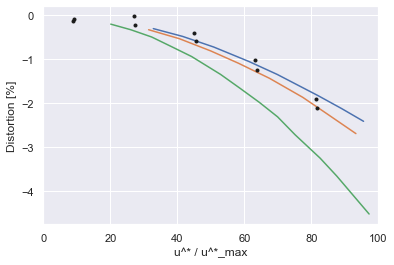

In [23]:
plt.plot(lens0.r, lens0.e)
plt.plot(lens1.r, lens1.e)
plt.plot(lens2.r, lens2.e)
plt.plot(100*abs(c0-dd.x0)/c0, -abs(100*(dd.x0-(dd.c-dd.b**2/(4*dd.a)))/c0), 'k.')
plt.xlabel(r'u^* / u^*_max')
plt.ylabel(r'Distortion [%]')
plt.xlim(0,100)
#plt.ylim(-, -5)
plt.plot()

fit error...
fit error...


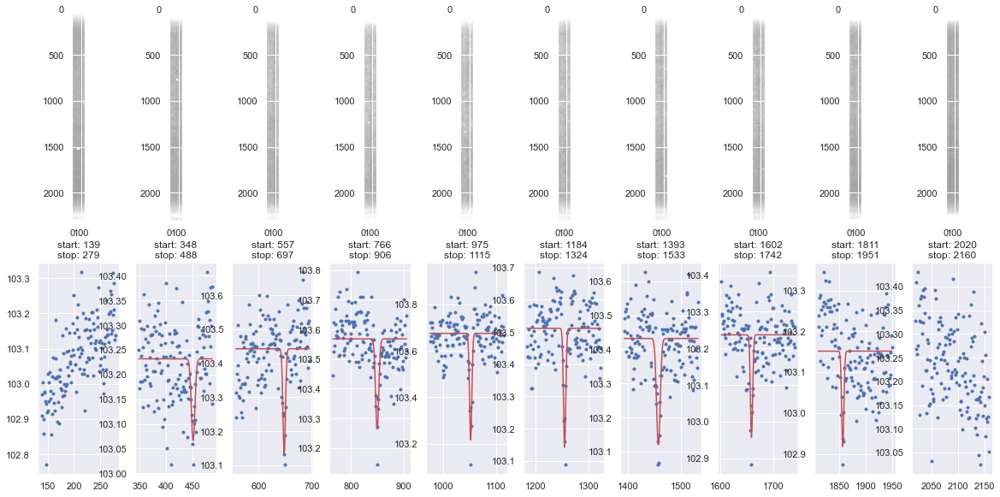

In [24]:
columns = ["slice", "x0", "x0_fit", "sigma_fit"]
dft = pd.DataFrame(columns = columns)

vmin = 95
vmax = 105
centri = majorx_ticks[1:-1]
x = np.arange(0, imgt.shape[0])
fig, ax = plt.subplots (2,len(centri), figsize=(20,10))
for i in range(len(centri)):
    xc = centri[i]
    dx0 = 70
    xs = xc - dx0
    xe = xc + dx0
    y = np.mean(imgt[ys:ye,:], axis=0)

    ax[0, i].imshow(imgt[:,xs:xe], cmap='gray', vmin=vmin, vmax=vmax) 
    ax[1, i].set_title('start: '+str(xs)+'\nstop: '+str(xe))
    ax[1, i].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
    try:
        p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))
        popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
        ax[1, i].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
        if (popt[2]<10.):
            dft  = dft.append({columns[0]:j, columns[1]:xc, columns[2]:popt[1], columns[3]:popt[2]},
            ignore_index=True)
    except:
        print ("fit error...")


plt.show()


In [25]:
dft

,slice,x0,x0_fit,sigma_fit
0,7.0,418.0,450.694013,3.398973
1,7.0,627.0,648.313030,2.370241
2,7.0,836.0,849.537147,3.051643
3,7.0,1045.0,1051.821132,2.204004
4,7.0,1254.0,1254.873298,2.203771
5,7.0,1463.0,1457.524622,3.468180
6,7.0,1672.0,1659.160135,2.156684
7,7.0,1881.0,1857.091733,2.098538


[-2.26998701e-02  1.03838969e+02]
[-1.51068891e-04  2.02826538e-01  2.97430917e+01]
[-1.17875288e-02  8.99841822e+01]
[-2.95429182e-06 -7.85622085e-03  8.89616501e+01]
[-9.55886824e-04  7.78117687e+01]
[ 1.22188414e-05 -2.08952939e-02  8.53732751e+01]
[3.26519291e-03 7.22102372e+01]
[1.28057541e-06 1.37443854e-03 7.26397826e+01]
[4.07411392e-03 6.83160354e+01]
[3.92618467e-06 1.20517872e-05 6.89293704e+01]
[2.52082915e-03 6.98666051e+01]
[-2.49819642e-06  8.90825875e-03  6.62758957e+01]
[4.95847160e-04 6.87686739e+01]
[-9.03216610e-06  1.23370408e-02  6.62125115e+01]
[2.20845029e-03 6.15660372e+01]
[-9.47179658e-06  1.49293100e-02  5.86700962e+01]
[-4.12861987e-04  5.37554585e+01]
[-2.97438790e-05  3.76432131e-02  5.13194953e+01]
[1.91278834e-02 4.22661861e+01]
[ 8.82054896e-05 -1.49611949e-01  1.11590811e+02]


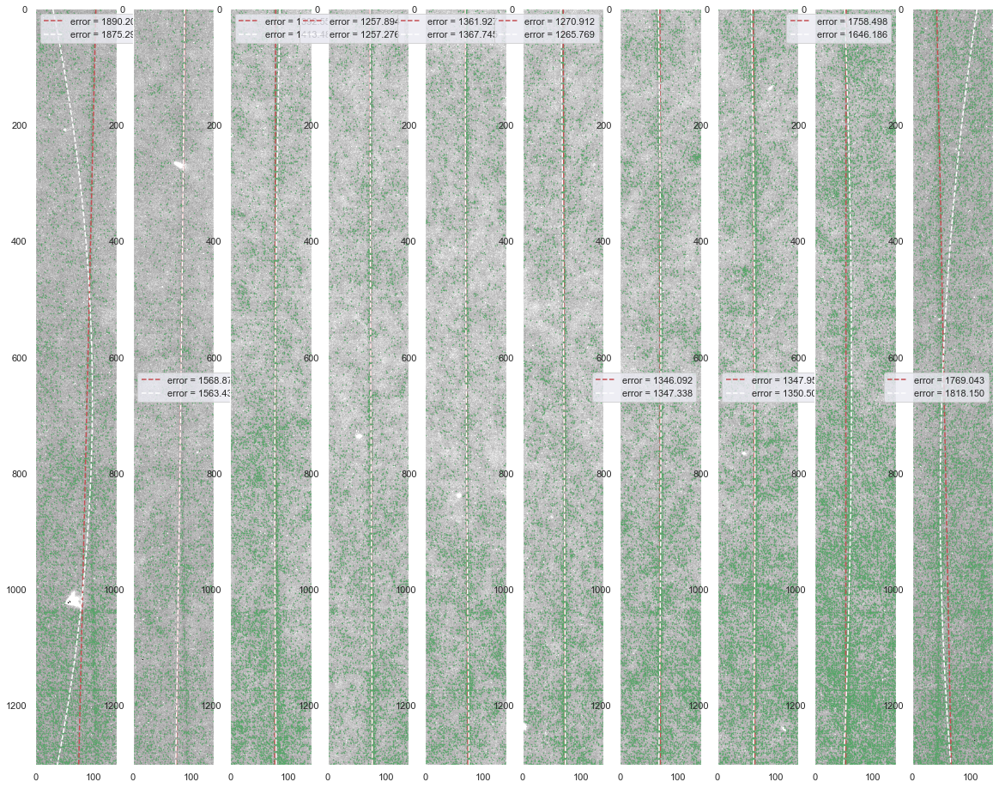

In [26]:
from skimage.measure import LineModelND, ransac, CircleModel
from skimage import io, feature, color, measure, draw, img_as_float
from sklearn.metrics import mean_squared_error, r2_score


from sklearn.linear_model import (
    LinearRegression, TheilSenRegressor, RANSACRegressor, HuberRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

min_samples=2
residual_threshold=2
max_trials=1000
random_state=42
rebins = 1
fig, ax = plt.subplots (1,len(x0), figsize=(20,30))
for i in range(len(centri)):
    xc = centri[i]
    dx0 = 70
    xs = xc - dx0
    xe = xc + dx0
    ys = 500
    ye = imgt.shape[0]-ys
    #imgr = imgt[ys:ye,xs:xe].reshape((imgt.shape[0]-2*ys,dx))
    imgr = cy.rebin(imgt[ys:ye,xs:xe],(int(imgt[ys:ye,xs:xe].shape[0]/rebins), 
                                       int(imgt[ys:ye,xs:xe].shape[1]/rebins)))
    ax[i].imshow(imgt[ys:ye,xs:xe], cmap='gray', vmin=vmin, vmax=vmax) 
    if i <= 1 or i >= 9 :
        C_max = 100.5
        C_min = 96
    else:
        C_max = 101
        C_min = 98
    edges   = ((imgt[ys:ye,xs:xe] < C_max) & (imgt[ys:ye,xs:xe] > C_min))
    edges   = ((imgr < C_max) & (imgr > C_min))
    points  = np.array(np.nonzero(edges)).T.astype(float)

    X = points[:,0][:, np.newaxis]

    model = make_pipeline(PolynomialFeatures(1), RANSACRegressor(min_samples=50, max_trials=100,
                             loss='absolute_loss', random_state=42,
                             residual_threshold=10))
    model.fit(X, points[:,1])
    line_mse = mean_squared_error(model.predict(X), points[:,1])
    line_y = model.predict(points[:,0][:, np.newaxis])

    coeffs = np.polyfit(points[:,0], line_y, 1)
    print (coeffs)

    poly_degree = 2
    model = make_pipeline(PolynomialFeatures(poly_degree), RANSACRegressor(min_samples=50, max_trials=100,
                             loss='absolute_loss', random_state=42,
                             residual_threshold=10))
    model.fit(X, points[:,1])
    poly_mse = mean_squared_error(model.predict(X), points[:,1])
    poly_y = model.predict(points[:,0][:, np.newaxis])


    coeffs = np.polyfit(points[:,0], poly_y, poly_degree)
    print (coeffs)

    ax[i].plot(points[:,1]*rebins, points[:,0]*rebins, 'g.', markersize=1)
    ax[i].plot(line_y*rebins,points[:,0]*rebins, 'r--', label='error = %.3f' % (line_mse))
    ax[i].plot(poly_y*rebins,points[:,0]*rebins, 'w--', label='error = %.3f' % (poly_mse))

    ax[i].legend()
    ax[i].grid(False)
plt.show()

In [27]:
cy.rebin(imgt[ys:ye,xs:xe],(int(1304/4), int(140/4)))

ndarray_inHisFile([[101.626875  , 101.746875  , 101.61125   , ...,
                    101.75770833, 101.44666667, 101.263125  ],
                   [101.38145833, 101.974375  , 101.87354167, ...,
                    101.61770833, 101.67958333, 101.74375   ],
                   [101.49020833, 101.56270833, 101.86      , ...,
                    101.91145833, 101.49291667, 101.86458333],
                   ...,
                   [101.095     , 101.25104167, 101.27625   , ...,
                    101.47208333, 101.41375   , 101.15479167],
                   [101.27875   , 101.2775    , 100.979375  , ...,
                    101.36395833, 101.53270833, 101.35458333],
                   [101.29125   , 101.68854167, 101.27979167, ...,
                    101.03041667, 100.95875   , 100.91395833]])

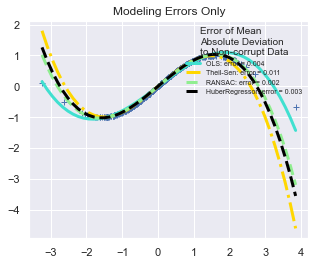

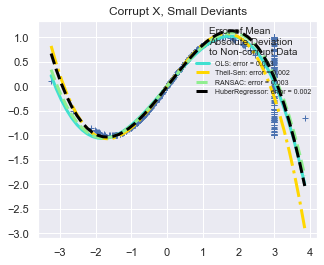

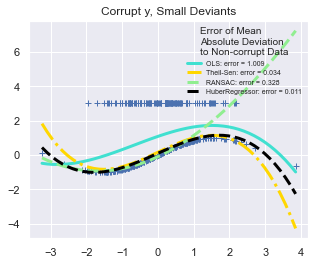

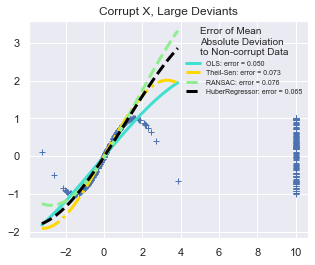

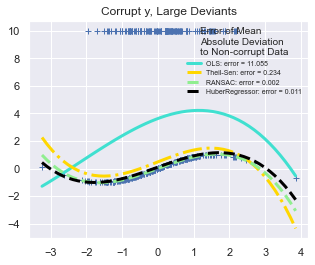

In [28]:
from matplotlib import pyplot as plt
import numpy as np

from sklearn.linear_model import (
    LinearRegression, TheilSenRegressor, RANSACRegressor, HuberRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

np.random.seed(42)

X = np.random.normal(size=400)
y = np.sin(X)
# Make sure that it X is 2D
X = X[:, np.newaxis]

X_test = np.random.normal(size=200)
y_test = np.sin(X_test)
X_test = X_test[:, np.newaxis]

y_errors = y.copy()
y_errors[::3] = 3

X_errors = X.copy()
X_errors[::3] = 3

y_errors_large = y.copy()
y_errors_large[::3] = 10

X_errors_large = X.copy()
X_errors_large[::3] = 10

estimators = [('OLS', LinearRegression()),
              ('Theil-Sen', TheilSenRegressor(random_state=42)),
              ('RANSAC', RANSACRegressor(random_state=42)),
              ('HuberRegressor', HuberRegressor())]
colors = {'OLS': 'turquoise', 'Theil-Sen': 'gold',
          'RANSAC': 'lightgreen', 'HuberRegressor': 'black'}
linestyle = {'OLS': '-', 'Theil-Sen': '-.', 'RANSAC': '--', 'HuberRegressor': '--'}
lw = 3

x_plot = np.linspace(X.min(), X.max())
for title, this_X, this_y in [
        ('Modeling Errors Only', X, y),
        ('Corrupt X, Small Deviants', X_errors, y),
        ('Corrupt y, Small Deviants', X, y_errors),
        ('Corrupt X, Large Deviants', X_errors_large, y),
        ('Corrupt y, Large Deviants', X, y_errors_large)]:
    plt.figure(figsize=(5, 4))
    plt.plot(this_X[:, 0], this_y, 'b+')

    for name, estimator in estimators:
        model = make_pipeline(PolynomialFeatures(3), estimator)
        model.fit(this_X, this_y)
        mse = mean_squared_error(model.predict(X_test), y_test)
        y_plot = model.predict(x_plot[:, np.newaxis])
        plt.plot(x_plot, y_plot, color=colors[name], linestyle=linestyle[name],
                 linewidth=lw, label='%s: error = %.3f' % (name, mse))

    legend_title = 'Error of Mean\nAbsolute Deviation\nto Non-corrupt Data'
    legend = plt.legend(loc='upper right', frameon=False, title=legend_title,
                        prop=dict(size='x-small'))
#    plt.xlim(-4, 10.2)
#    plt.ylim(-2, 10.2)
    plt.title(title)
plt.show()

In [29]:




from sklearn.metrics import mean_squared_error
class PolynomialRegression(object):
    def __init__(self, degree=3, coeffs=None):
        self.degree = degree
        self.coeffs = coeffs

    def fit(self, X, y):
        self.coeffs = np.polyfit(X.ravel(), y, self.degree)

    def get_params(self, deep=False):
        return {'coeffs': self.coeffs}

    def set_params(self, coeffs=None, random_state=None):
        self.coeffs = coeffs

    def predict(self, X):
        poly_eqn = np.poly1d(self.coeffs)
        y_hat = poly_eqn(X.ravel())
        return y_hat

    def score(self, X, y):
        return mean_squared_error(y, self.predict(X))

from sklearn.linear_model import RANSACRegressor

y_vals = np.array([0.00441025, 0.0049001 , 0.01041189, 0.47368389, 0.34841961,
       0.3487533 , 0.35067096, 0.31142986, 0.3268407 , 0.38099566,
       0.3933048 , 0.3479948 , 0.02359819, 0.36329588, 0.42535543,
       0.01308297, 0.53873956, 0.6511364 , 0.61865282, 0.64750302,
       0.6630047 , 0.66744816, 0.71759617, 0.05965622, 0.71335208,
       0.71992683, 0.61635697, 0.12985441, 0.73410642, 0.77318621,
       0.75675988, 0.03003641, 0.77527201, 0.78673995, 0.05049178,
       0.55139476, 0.02665514, 0.61664748, 0.81121749, 0.05521697,
       0.63404375, 0.32649395, 0.36828268, 0.68981099, 0.02874863,
       0.61574739])
x_vals = np.linspace(0, 1, len(y_vals))
poly_degree = 3

coeffs = np.polyfit(x_vals, y_vals, poly_degree)
poly_eqn = np.poly1d(coeffs)
y_hat = poly_eqn(x_vals)

ransac = RANSACRegressor(PolynomialRegression(degree=poly_degree),
                         residual_threshold=2 * np.std(y_vals),
                         random_state=0)
ransac.fit(np.expand_dims(x_vals, axis=1), y_vals)
inlier_mask = ransac.inlier_mask_

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RankWarning: Polyfit may be poorly conditioned
  if sys.path[0] == '':
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RankWarning: Polyfit may be poorly conditioned
  if sys.path[0] == '':
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RankWarning: Polyfit may be poorly conditioned
  if sys.path[0] == '':
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RankWarning: Polyfit may be poorly conditioned
  if sys.path[0] == '':


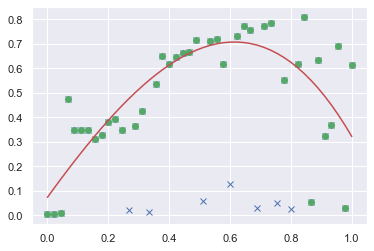

In [30]:
y_hat = ransac.predict(np.expand_dims(x_vals, axis=1))
plt.plot(x_vals, y_vals, 'bx', label='input samples')
plt.plot(x_vals[inlier_mask], y_vals[inlier_mask], 'go', label='inliers (2*STD)')
plt.plot(x_vals, y_hat, 'r-', label='estimated curve')
plt.show()

In [31]:
        dx0 = 25
        x0  = 25
        xs  = x0-dx0
        xe  = x0+dx0
        ax[1, i].set_title('start: '+str(starty)+' stop: '+str(starty+dy))
        ax[1, i].plot(x[xs:xe], y[xs:xe], 'b.', label='x')
        try:
            p0=(-min(y[xs:xe])-np.mean(y[xs:xe]),  x[xs:xe][np.argmin(y[xs:xe])], 5, np.mean(y[xs:xe]))

            popt, pcov = curve_fit(my.Gauss, x[xs:xe], y[xs:xe], p0=p0)
            ax[1, i].plot(x[xs:xe], my.Gauss(x[xs:xe], *popt), 'r-')
            # print (popt)       
            df  = df.append({columns[0]:i, columns[1]:x0, columns[2]:popt[1], columns[3]:popt[2]},
                ignore_index=True)
        except:
            print ("fit error...")

IndexError: too many indices for array

In [ ]:
plt.style.use('fast')
plt.rc('font', size = 14, family ='Sans-Serif')
fig, ax = plt.subplots(1,1, figsize=(10,10))
#im = plt.imread('/Users/mazzitel/lime/lastra.PNG')
from skimage.io import imread
im = imread("/Users/mazzitel/lime/frame_light.png")
plt.imshow(im, cmap='gray')
plt.show()
img_data = np.zeros((im.shape[0], im.shape[1]))
for x in range(im.shape[0]):
    for y in range(im.shape[1]):
        img_data[x,y] = im[x,y][0]

In [ ]:
plt.style.use('fast')
plt.rc('font', size = 14, family ='Sans-Serif')
fig, ax = plt.subplots(1,1, figsize=(10,10))
#im = plt.imread('/Users/mazzitel/lime/lastra.PNG')
from skimage.io import imread
im = imread("/Users/mazzitel/lime/3728.png")
plt.imshow(im, cmap='gray')
plt.show()
img_data = np.zeros((im.shape[0], im.shape[1]))
for x in range(im.shape[0]):
    for y in range(im.shape[1]):
        img_data[x,y] = im[x,y][0]


In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
y = np.mean(img_data, axis=0)
x = np.arange(0, img_data.shape[0])
#x = np.arange(0, 2300)
ax.plot(x, y, 'b', label='x')
#y = np.mean(img_data, axis=1)
#x = np.arange(0, img_data.shape[0])
#x = np.arange(0, 2300)
#ax.plot(x, y, 'r', label='y', alpha= 0.5)
ax.legend()
plt.show()

In [ ]:
cuts = 50
plt.plot(x[cuts:-cuts], y[cuts:-cuts], 'k.--')
plt.grid()
plt.show()
signalFFT = np.fft.rfft(y[cuts:-cuts])
signalPSD = np.abs(signalFFT) ** 2
fftFreq = np.fft.fftfreq(len(signalPSD))
i = fftFreq>0
A = 10*np.log10(signalPSD[i])
plt.plot(fftFreq[i], A, 'b-')
plt.grid()
plt.show()
print('giorni max: '+str(1/fftFreq[i][np.argmax(A)]))
print('giorni min: '+str(1/fftFreq[i][np.argmin(A)]))

In [ ]:
fftFreq.shape[0]*2, y[cuts:-cuts].shape[0]

In [ ]:
sys.path.append('../script')
from readerHIS import openHIS
his_file= '/Users/mazzitel/lime/angle_0.HIS'
his = openHIS(his_file)

for idx, img in enumerate(his):
        fig = plt.figure(figsize=(10,10))
        plt.imshow(img, cmap='gray', vmin=98, vmax=2500)
        plt.show()

In [ ]:
run          = 4049
run_ped       = 4060

# KFC
run          = 4035
run_ped       = 4034

cimax         = 10
cimin         = 0 
tag           = 'LAB'
nsigma        = 0.5

m_image, s_image = cy.ped_(run_ped, path=mybasepath+'ped/')
cfile = cy.open_(run, tag=tag, posix=posix, verbose=True)

In [ ]:
for iTr in range(0, cfile.max_image):
    image = rtnp.hist2array(cfile.file.Get(cfile.pic[iTr])).T
    if iTr>0:
        sum_image += image-m_image
    else:
        sum_image = image-m_image
    if (iTr % 20 == 0):
        print('tarck', iTr)
fig = plt.figure(figsize=(10,10))
plt.imshow((sum_image/iTr), cmap='gray', vmin=-3, vmax=2)
plt.show()

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.imshow((sum_image/iTr), cmap='gray', vmin=-2, vmax=2)
plt.show()

In [ ]:
img_data=(sum_image/iTr)
nsigma        = 0
th_image   = np.round(nsigma*s_image)
edges = (img_data > th_image) & (th_image < cimax)
fig, ax = plt.subplots (1,2, figsize=(20,10))
ax[0].imshow(img_data, cmap='jet', vmin=cimin, vmax=cimax)
ax[1].imshow(edges, cmap='YlGnBu', vmin=0,vmax=1)
ax[1].grid(False)
plt.show()

In [ ]:
cuts = 800
nsigma        = 0
th_image   = np.round(nsigma*s_image)
edges = (img_data > th_image) & (th_image < cimax)
fig, ax = plt.subplots (1,2, figsize=(20,10))
ax[0].imshow(img_data[cuts:img_data.shape[0]-cuts,], cmap='jet', vmin=cimin, vmax=cimax)
ax[1].imshow(np.invert(edges[cuts:img_data.shape[0]-cuts,]), cmap='YlGnBu', vmin=0,vmax=1)
ax[1].grid(False)
plt.show()

In [ ]:
def proj_xy(img_data, x=True, y=True):
    import numpy as np
    import matplotlib.pyplot as plt
    if x:
        y_x = np.mean(img_data, axis=0)
        x_x = np.arange(0, img_data.shape[1])
        ax.plot(x_x, y_x, 'b', label='proj x')
    if y:
        y_y = np.mean(img_data, axis=1)
        x_y = np.arange(0, img_data.shape[0])
        ax.plot(x_y, y_y, 'r', label='proj y', alpha= 0.5)
    # for i in range(1,len(yy)):
    #     dy = yy[i]-yy[i-1]
    #     if abs(dy)<0.005:
    #         ax.axvline(i, color='k')
    ax.legend()
    return ax
fig, ax = plt.subplots(1,1, figsize=(10,5))
proj_xy(edges[cuts:img_data.shape[0]-cuts,])
ax.axvline(150, color='k')
ax.axvline(img_data.shape[0]-150, color='k')
plt.show()

In [ ]:
y_x = np.mean(img_data, axis=0)
x_x = np.arange(0, img_data.shape[0])
dy = np.zeros(len(y_x))
for i in range(1,len(y_x)):
    dy[i] = y_x[i]-y_x[i-1]


In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.plot(x_x, abs(dy), 'r', label='proj y', alpha= 0.5)
plt.show()

In [ ]:
# esempio con l'uso della pipeline
#
y_values = np.array([0.00441025, 0.0049001 , 0.01041189, 0.47368389, 0.34841961,
       0.3487533 , 0.35067096, 0.31142986, 0.3268407 , 0.38099566,
       0.3933048 , 0.3479948 , 0.02359819, 0.36329588, 0.42535543,
       0.01308297, 0.53873956, 0.6511364 , 0.61865282, 0.64750302,
       0.6630047 , 0.66744816, 0.71759617, 0.05965622, 0.71335208,
       0.71992683, 0.61635697, 0.12985441, 0.73410642, 0.77318621,
       0.75675988, 0.03003641, 0.77527201, 0.78673995, 0.05049178,
       0.55139476, 0.02665514, 0.61664748, 0.81121749, 0.05521697,
       0.63404375, 0.32649395, 0.36828268, 0.68981099, 0.02874863,
       0.61574739])
x_values = np.linspace(0, 1, len(y_values))
poly_degree = 3

from sklearn.linear_model import (
    LinearRegression, TheilSenRegressor, RANSACRegressor, HuberRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
plt.plot(x_values, y_values, 'r.')
x_plot = np.linspace(x_values.min(), x_values.max())
X = x_values[:, np.newaxis]
model = make_pipeline(PolynomialFeatures(3), RANSACRegressor())
model.fit(X, y_values)
mse = mean_squared_error(model.predict(X), y_values)
y_plot = model.predict(x_plot[:, np.newaxis])
plt.plot(x_plot, y_plot, 'b-', label='error = %.3f' % (mse))
plt.show()

In [ ]:
# esempio senza l'uso della pipeline
#
y_values = np.array([0.00441025, 0.0049001 , 0.01041189, 0.47368389, 0.34841961,
       0.3487533 , 0.35067096, 0.31142986, 0.3268407 , 0.38099566,
       0.3933048 , 0.3479948 , 0.02359819, 0.36329588, 0.42535543,
       0.01308297, 0.53873956, 0.6511364 , 0.61865282, 0.64750302,
       0.6630047 , 0.66744816, 0.71759617, 0.05965622, 0.71335208,
       0.71992683, 0.61635697, 0.12985441, 0.73410642, 0.77318621,
       0.75675988, 0.03003641, 0.77527201, 0.78673995, 0.05049178,
       0.55139476, 0.02665514, 0.61664748, 0.81121749, 0.05521697,
       0.63404375, 0.32649395, 0.36828268, 0.68981099, 0.02874863,
       0.61574739])
x_values = np.linspace(0, 1, len(y_values))
poly_degree = 2

from sklearn.linear_model import (
    LinearRegression, TheilSenRegressor, RANSACRegressor, HuberRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
plt.plot(x_values, y_values, 'r.')
x_plot = np.linspace(x_values.min(), x_values.max())
X = x_values[:, np.newaxis]
pl = PolynomialFeatures(poly_degree)
X = pl.fit_transform(X, y_values)
rsac = RANSACRegressor()
rfit = rsac.fit(X, y_values)
y_plot = rfit.predict(X)
coeffs = np.polyfit(x_values, y_plot, poly_degree)
print (coeffs)
plt.plot(x_values, y_plot, 'b-')
plt.show()